<a href="https://colab.research.google.com/github/Rupesh-rkgit/DS3_Notes/blob/master/DCE%2B%2BDIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [29]:
%matplotlib inline

In [4]:
%cd /content/drive/MyDrive/Zero-DCE-master

/content/drive/MyDrive/Zero-DCE-master


In [32]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [5]:
ls

app/                   image_assets/  README.md         Trained_model/
CITATION.cff           LICENSE        requirements.txt  Trained_Model/
CODE_OF_CONDUCT.md     loldatasetv2/  sample_images/    train_model.py
command_line_scripts/  __MACOSX/      test_model.py     ZeroDCE/
_config.yml            output/        TFLITE_models/


In [10]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Zero-DCE-master/logs/Model

<IPython.core.display.Javascript object>

In [6]:
%run train_model.py --dataset_dir /content/drive/MyDrive/Zero-DCE-master/loldatasetv2/our485/low

Creating dataset pipeline...

Creating Zero-DCE model...

Compiling the model...

[INFO] Summary of model

Model: "DCE-net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 400, 600, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 400, 600, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 400, 600, 32  9248        ['conv2d[0][0]']   

In [11]:
ls

app/                   image_assets/  output/           TFLITE_models/
CITATION.cff           LICENSE        README.md         Trained_model/
CODE_OF_CONDUCT.md     logs/          requirements.txt  Trained_Model/
command_line_scripts/  loldatasetv2/  sample_images/    train_model.py
_config.yml            __MACOSX/      test_model.py     ZeroDCE/


[info] loading model from disk....


loaded model: <keras.saving.legacy.saved_model.load.ZeroDCE object at 0x7f73cc719e40>
total_image_count 485


100%|██████████| 24/24 [00:01<00:00, 23.85it/s]

Average inference time: 0.0 ms


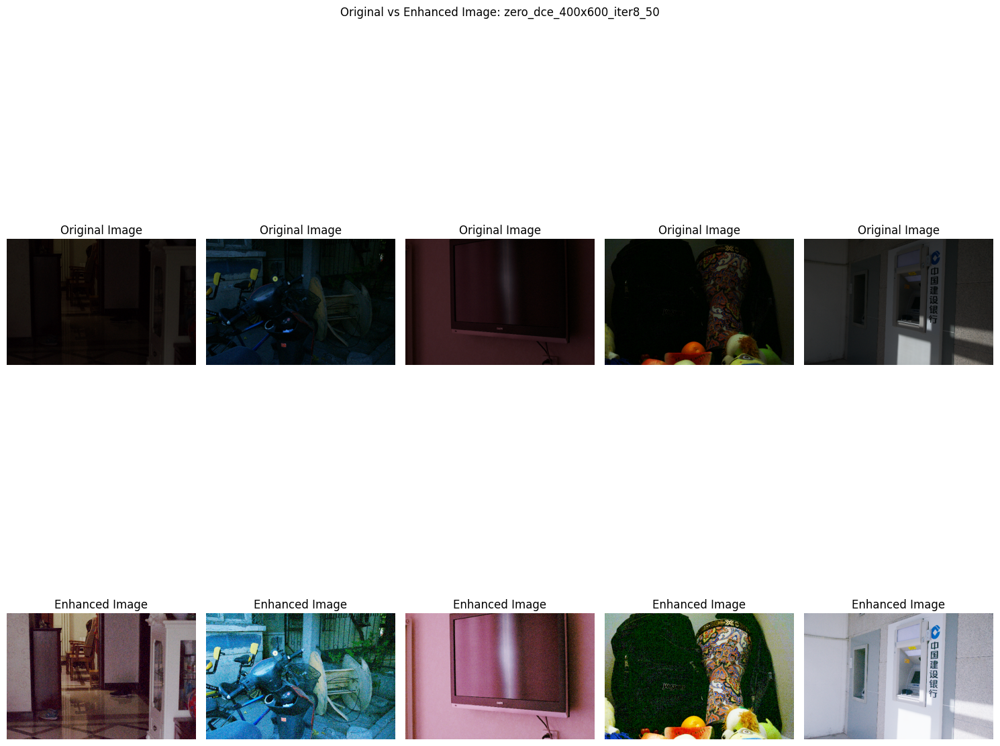

<Figure size 640x480 with 0 Axes>

In [31]:
%run test_model.py --model_path /content/drive/MyDrive/Zero-DCE-master/Trained_Model/zero_dce_iter8/zero_dce_400x600_iter8_50/ \
                      --img_h 400 \
                      --img_w 600 \
                      --save_plot 1 \
                      --load_random_data 0

[info] loading model from disk....


loaded model: <keras.saving.legacy.saved_model.load.ZeroDCE object at 0x7f7474b456f0>
[info] running inference....
[info] inference time: 1999.8466968536377 ms


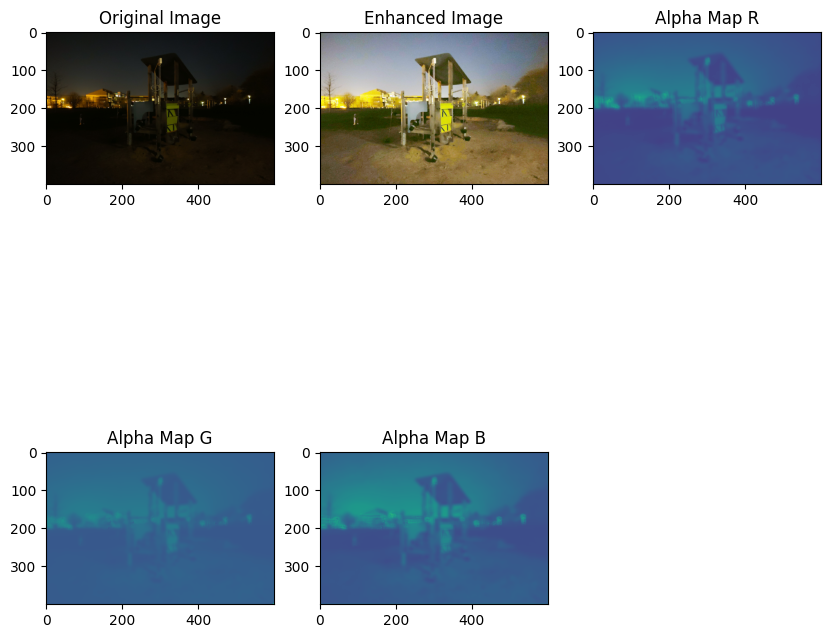

[info] saved enhanced image to disk


<Figure size 640x480 with 0 Axes>

In [30]:
# !python /content/drive/MyDrive/Zero-DCE-master/command_line_scripts/single_image_enhance.py --model_path /content/drive/MyDrive/Zero-DCE-master/Trained_Model/zero_dce_iter8/zero_dce_400x600_iter8_50/ \
#                                 --image_path /content/drive/MyDrive/Zero-DCE-master/sample_images/low_light_outdoor.jpg/ \
#                                 --img_h 400 \
#                                 --img_w 600 \

%run /content/drive/MyDrive/Zero-DCE-master/command_line_scripts/single_image_enhance.py --model_path /content/drive/MyDrive/Zero-DCE-master/Trained_Model/zero_dce_iter8/zero_dce_400x600_iter8_50/ \
                                --img_h 400 \
                                --img_w 600 \
                                --image_path /content/drive/MyDrive/Zero-DCE-master/sample_images/low_light_outdoor.jpg \
                                --plot 1 \
                                --save_result 1 \
                                


In [ ]:
%run /content/drive/MyDrive/Zero-DCE-master/command_line_scripts/enhance_low_light_video.py --model_path /content/drive/MyDrive/Zero-DCE-master/Trained_Model/zero_dce_iter8/zero_dce_400x600_iter8_50/ \
                                                                                            --video_path /content/drive/MyDrive/Zero-DCE-master/sample_images/low_ligh_video_cliped.mp4 \
                                                                                            


[info] loading model from disk....


loaded model: <keras.saving.legacy.saved_model.load.ZeroDCE object at 0x7f73c30b4070>
Frame size: 1280x720
Frames per second :  25.0 FPS
